<a href="https://colab.research.google.com/github/sanmoy1985/SolarFilamentACWE/blob/main/ACWE_based_Solar_Filament_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from  numpy import *
import cv2
import numpy
from scipy.cluster.vq import *
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi

from skimage import data
from skimage.metrics import (adapted_rand_error,
                              variation_of_information)
from skimage.filters import sobel
from skimage.measure import label
from skimage.util import img_as_float
from skimage.feature import canny
from skimage.morphology import remove_small_objects
from skimage.segmentation import (morphological_geodesic_active_contour,
                                  inverse_gaussian_gradient,
                                  watershed,
                                  mark_boundaries)

import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.segmentation import chan_vese
from google.colab.patches import cv2_imshow

from sklearn.metrics import accuracy_score
from sklearn.preprocessing import label_binarize, MultiLabelBinarizer
from sklearn import metrics
import time
import os

In [ ]:
def remove_redundant(out, filename):
    new_img = (out)
    print(new_img.shape)
    #find all your connected components (white blobs in your image)
    nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(new_img, connectivity=8, ltype=cv2.CV_16U)
    #connectedComponentswithStats yields every seperated component with information on each of them, such as size
    #the following part is just taking out the background which is also considered a component, but most of the time we don't want that.
    sizes = stats[1:, -1]; nb_components = nb_components - 1

    # minimum size of particles we want to keep (number of pixels)
    #here, it's a fixed value, but you can set it as you want, eg the mean of the sizes or whatever
    #min_size = 150
    # print(max(sizes))
    print(nb_components)
    # print(sizes)
    print(output)
    # print(output[100])

    analysis = cv2.connectedComponentsWithStats(new_img, connectivity=8, ltype=cv2.CV_16U )
    (totalLabels, label_ids, values, centroid) = analysis
    print(totalLabels)
    print(label_ids)

    #your answer image
    img2 = np.zeros((out.shape))
    #for every component in the image, you keep it only if it's above min_size
    for i in range(0, nb_components):

      #ratio = float(w)/h

      if sizes[i] < max(sizes)*0.1 and sizes[i] > max(sizes)*0.0002:
    #    if sizes[i] >= max(sizes)*0.11 and sizes[i] < max(sizes)*0.112: #For 193A
            img2[output == i + 1] = 255
    #         print(img2[output == i + 1])

    img2 = img2.reshape(out.shape).astype('int')

    # Plot the original and thresholded images
    # fig, axes = plt.subplots(1, 3, figsize=(12, 5))
    # axes[0].imshow(image_file1)
    # axes[0].set_title('Original Image')
    # axes[0].axis('off')
    # axes[1].imshow(image_file2)
    # axes[1].set_title('Ground-truth Image')
    # axes[1].axis('off')
    # axes[2].imshow(img2)
    # axes[2].set_title('Segmented Image')
    # axes[2].axis('off')
    # plt.show()

    cv2.imwrite('/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/final_out/'+ filename, img2)

    return img2

In [ ]:
#Binary image convertion
def binary_convert(image_file):
    actual = cv2.cvtColor(image_file, cv2.COLOR_BGR2GRAY)
    #actual = cv2.resize(actual,(1024, 1024))
    print(actual.dtype)
    actual = np.float32((actual/255)*255)
    actual[actual >= 127] = 255
    actual[actual < 127] = 0
    # calculate frequency of pixels in range 0-255
    # histga = cv2.calcHist([actual],[0],None,[256],[0,256])
    actual = actual.flatten()
    return actual

In [ ]:
def process_image(image_path, filename):
    try:
        #image = Image.open(image_path)
        image = cv2.imread(image_path + filename)
        # Process the image here if needed

        gray1 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        contrast_stretched = cv2.GaussianBlur(gray1,(3,3),0)

        # get the shape of the image
        height, width = contrast_stretched.shape[0], contrast_stretched.shape[1]

        # Converting all pixels greater than zero to black while black becomes white
        for i in range(height):
            for j in range(width):
                if contrast_stretched[i, j].sum() < 140:
                    contrast_stretched[i, j] = 0
                else:
                    contrast_stretched[i, j] = 255

        # saving the mask
        mask = contrast_stretched


        gray2 = contrast_stretched
        # plt.imshow(gray2, cmap='gray')

        # Inpaint.
        dst = cv2.inpaint(gray1, mask, 3, cv2.INPAINT_NS)
        cv2_imshow(dst)
        cv2.imwrite('/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/inpaint/'+ filename, dst)

        # Apply log transformation method
        c = 255 / np.log(1 + np.max(dst))
        log_image = c * (np.log(dst + 1))

        # Specify the data type so that
        # float value will be converted to int
        log_image = np.array(log_image, dtype = np.uint8)
        cv2_imshow(log_image)
        cv2.imwrite('/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/log/'+ filename, log_image)

        # Create the sharpening kernel
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

        # Sharpen the image
        sharpened_image = cv2.filter2D(log_image, 2, kernel)

        gray=sharpened_image
        cv2_imshow(gray)
        cv2.imwrite('/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/sharp/'+ filename, gray)



        cv = chan_vese(gray, mu=0.003, lambda1=1.000001, lambda2=0.1, tol=1e-10,
                      dt=0.5, init_level_set="disk", extended_output=True)

        fig, axes = plt.subplots(2, 2, figsize=(8, 8))
        ax = axes.flatten()

        ax[0].imshow(image, cmap="gray")
        ax[0].set_axis_off()
        ax[0].set_title("Original Image", fontsize=12)

        ax[1].imshow(cv[0], cmap="gray")
        ax[1].set_axis_off()
        title = "Chan-Vese segmentation - {} iterations".format(len(cv[2]))
        ax[1].set_title(title, fontsize=12)

        ax[2].imshow(cv[1], cmap="gray")
        ax[2].set_axis_off()
        ax[2].set_title("Final Level Set", fontsize=12)

        ax[3].plot(cv[2])
        ax[3].set_title("Evolution of energy over iterations", fontsize=12)

        fig.tight_layout()
        plt.show()

        output = cv[0]*255
        output = ~output.astype(np.uint8)


################################################################################################################################################
        cv2.imwrite('/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/ini_out/'+ filename, output)
        #cv2_imshow(out)
        img2=remove_redundant(output, filename)

        return True
    except Exception as e:
        print(f"Failed to process image: {image_path}. Error: {e}")
        return False

In [ ]:
def main():
    # Path to your image folder in Google Drive
    image_folder = '/content/drive/MyDrive/Bulk_Filament_Detection/train/image/'

    # List all files in the folder
    image_files = os.listdir(image_folder)

    idx=0
    start = time.time()
    print(start)
    # Process each image file
    for image_file in image_files:
      if image_file.endswith('.jpg') or image_file.endswith('.png'):
        if process_image(image_folder, image_file):
          print(f"Image {idx + 1} processed successfully.")
          end = time.time()
          elapsed_time = end - start
          print('Execution time:', elapsed_time, 'sec')
          idx = idx+1
        else:
          print(f"Failed to process image {idx + 1}.")
          idx = idx+1

1729645006.406299


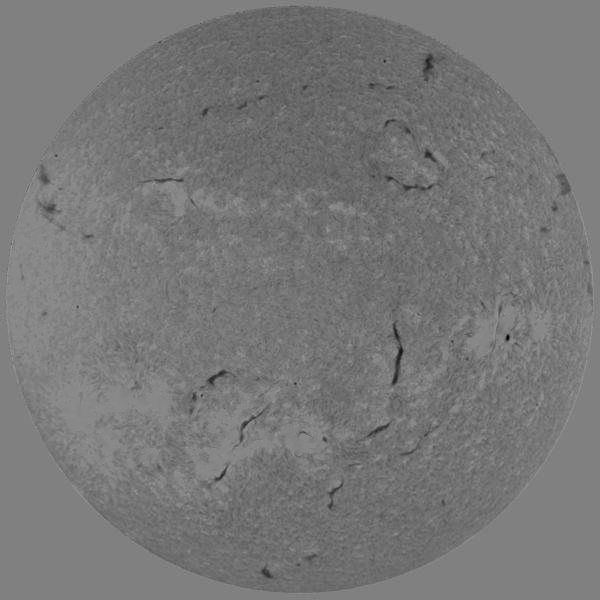

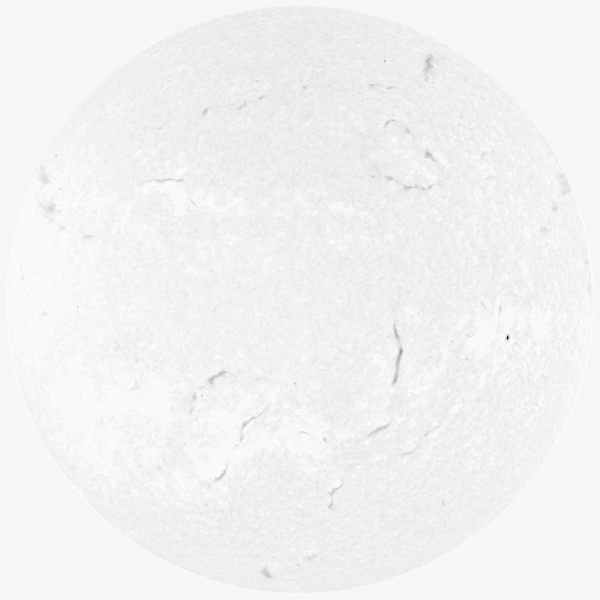

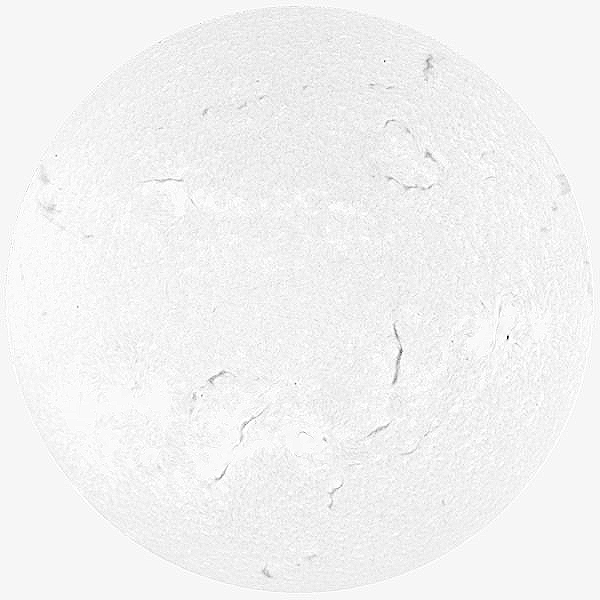

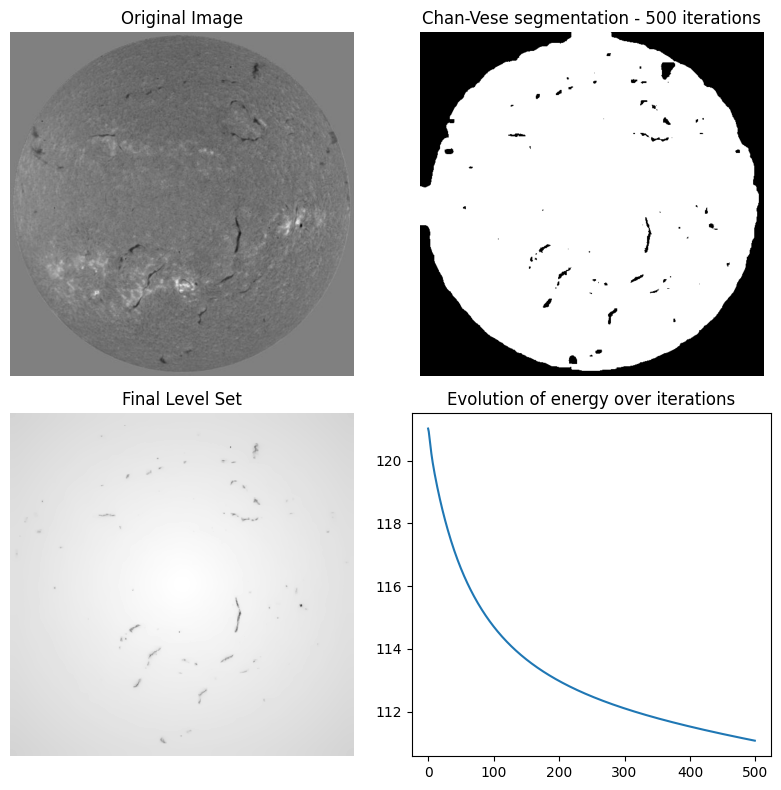

(600, 600)
73
[[1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
74
[[1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
uint8


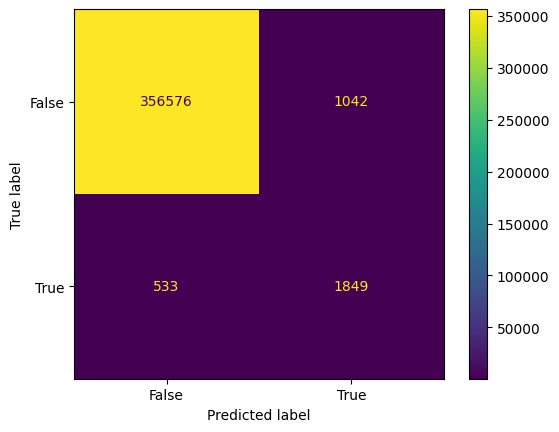

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130206_225606_unetimg.jpg'
Failed to process image 1.


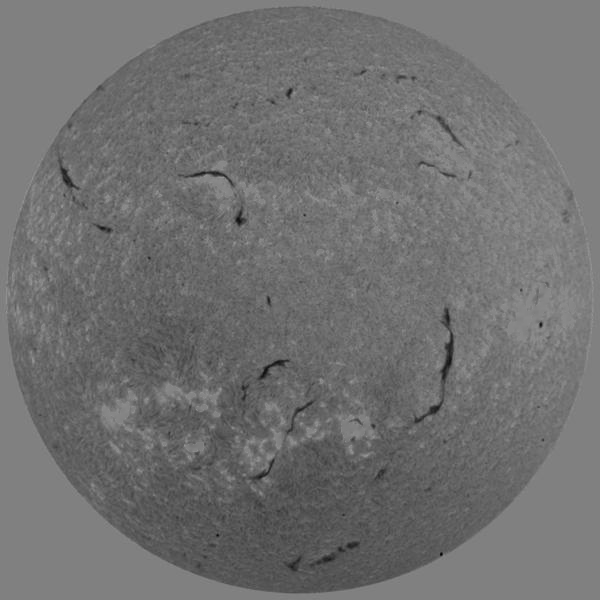

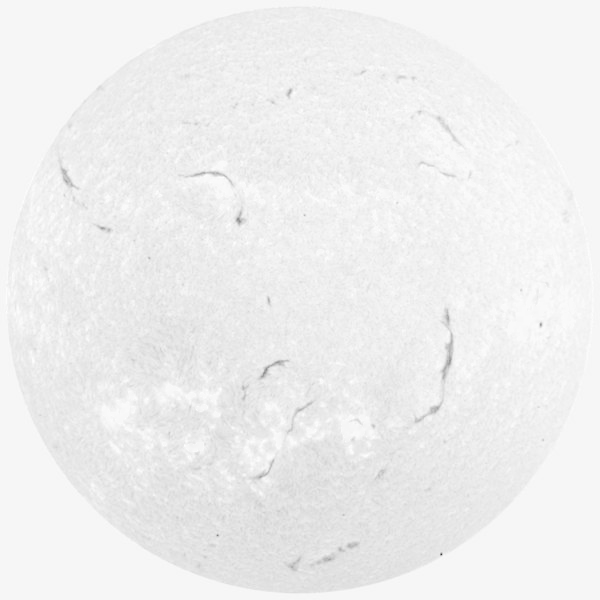

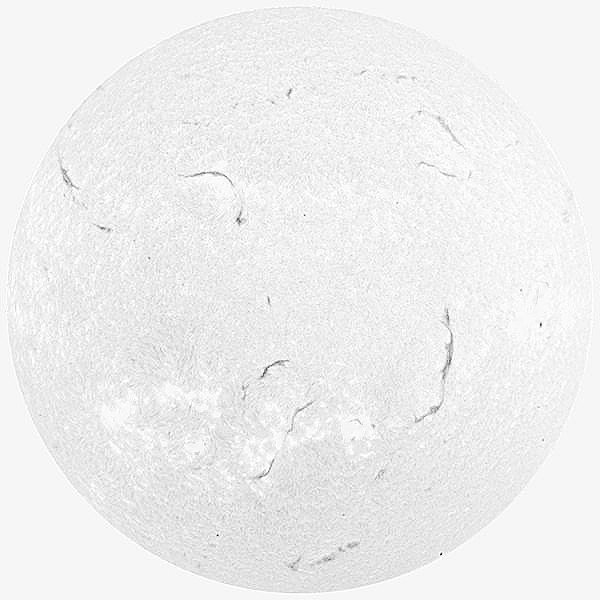

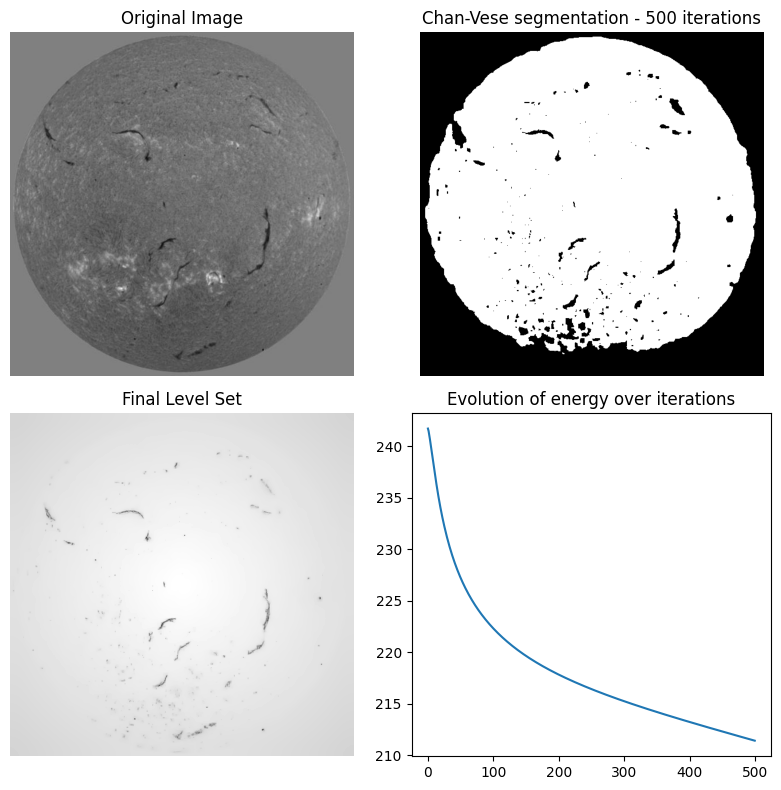

(600, 600)
231
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
232
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


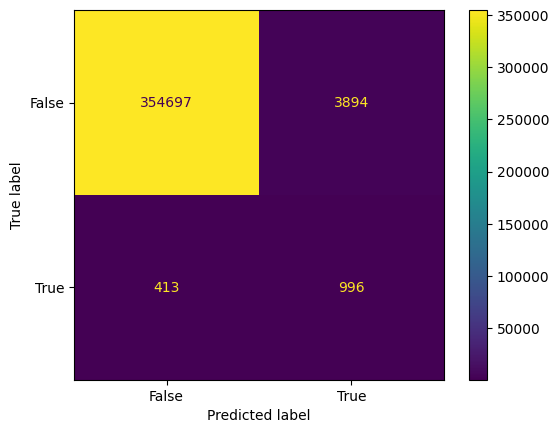

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130207_183307_unetimg.jpg'
Failed to process image 2.


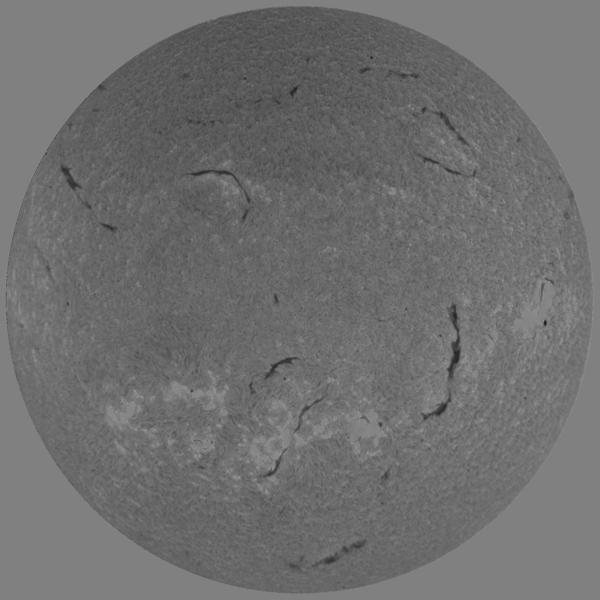

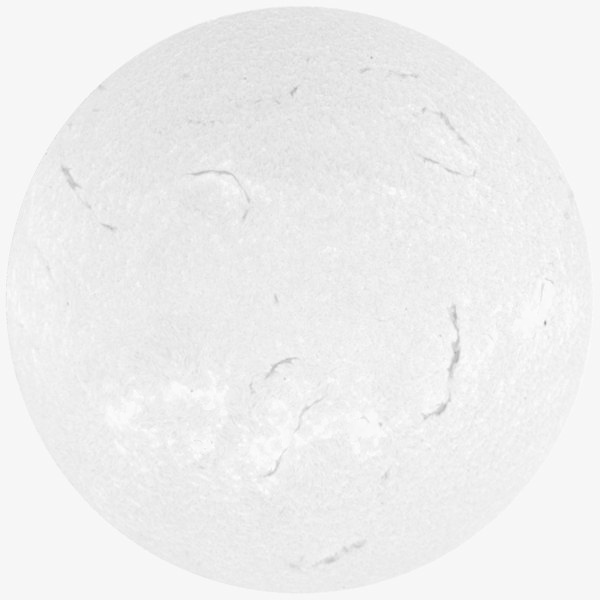

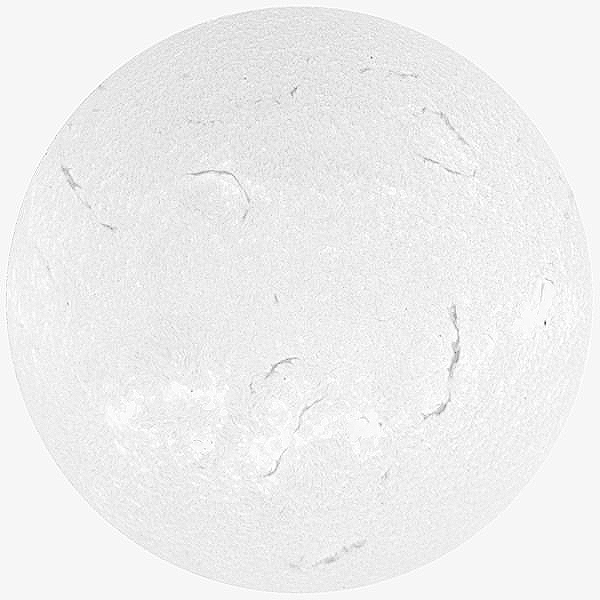

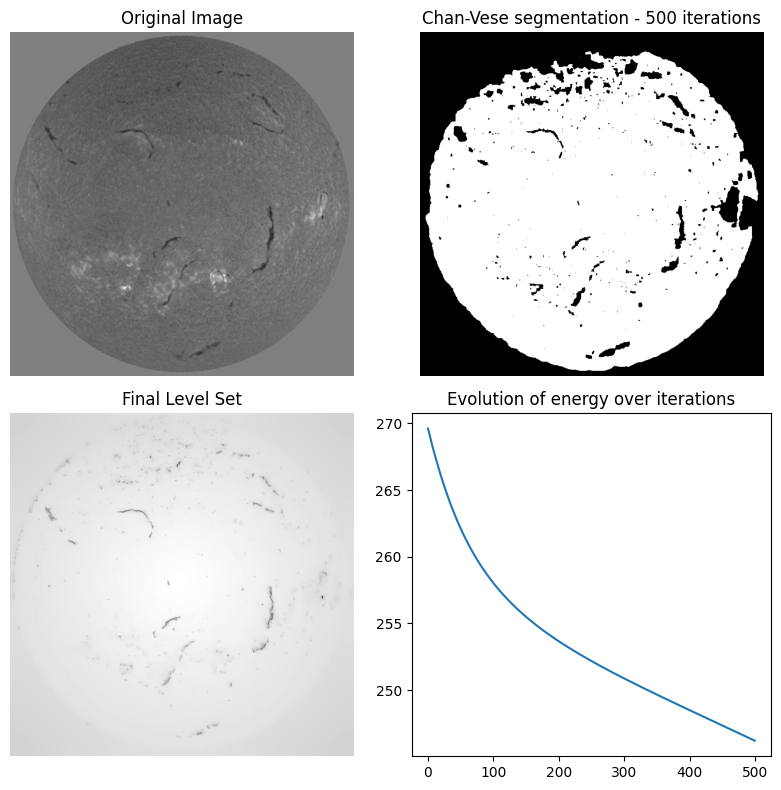

(600, 600)
337
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
338
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


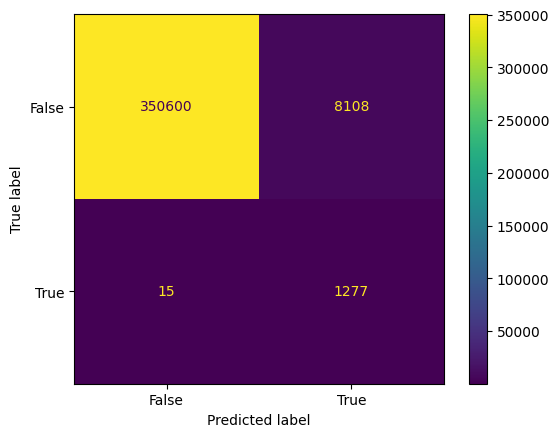

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130207_212459_unetimg.jpg'
Failed to process image 3.


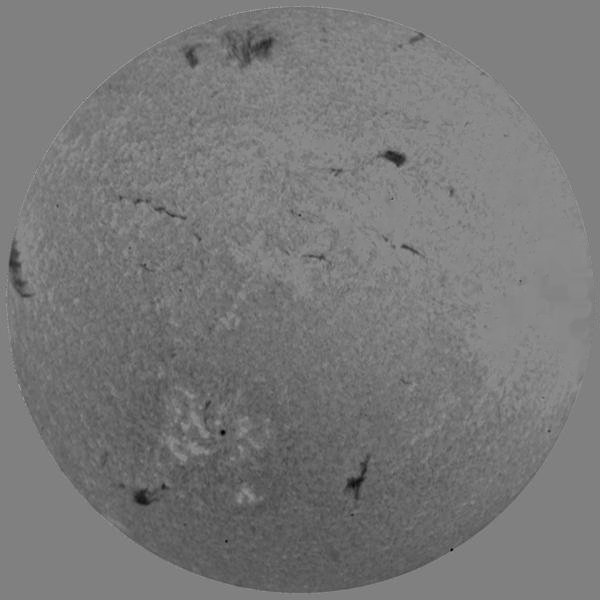

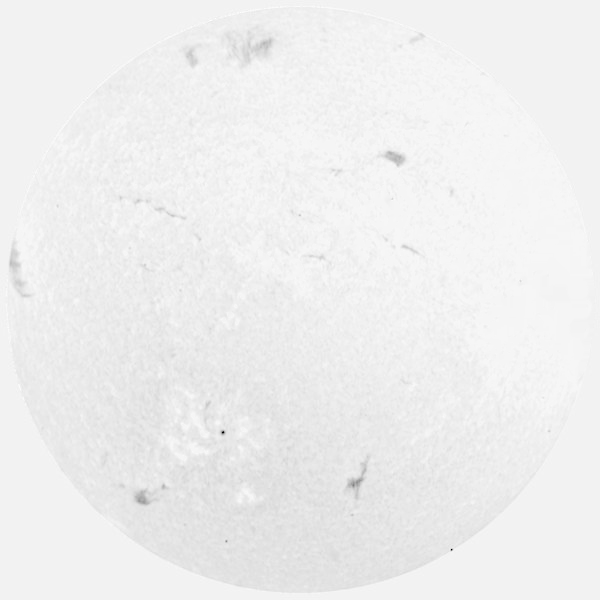

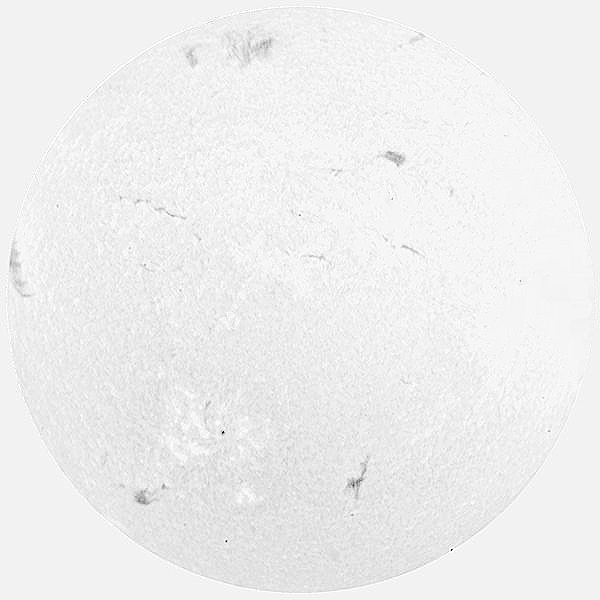

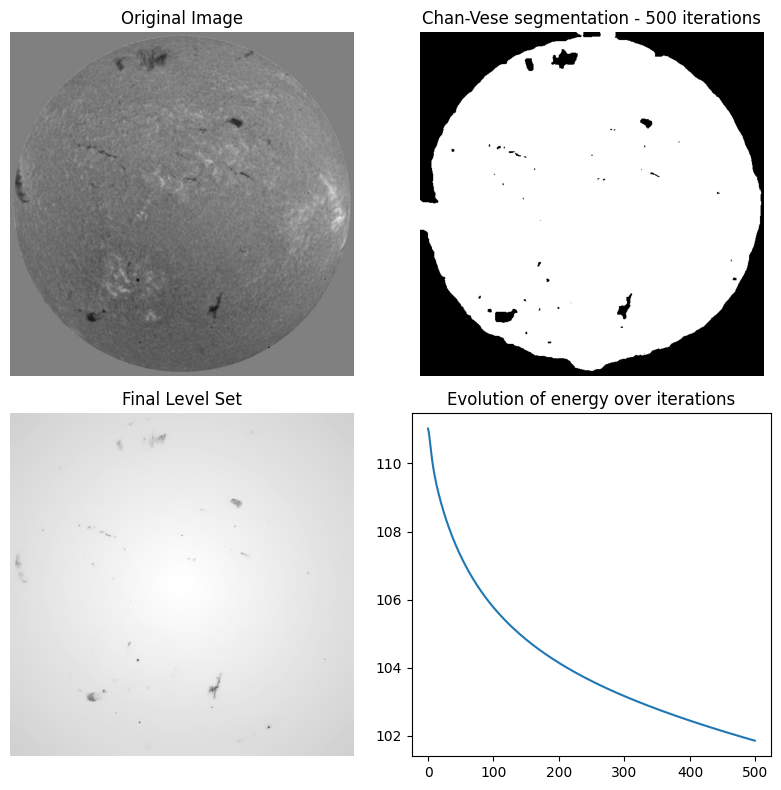

(600, 600)
44
[[1 1 1 ... 3 3 3]
 [1 1 1 ... 3 3 3]
 [1 1 1 ... 3 3 3]
 ...
 [3 3 3 ... 3 3 3]
 [3 3 3 ... 3 3 3]
 [3 3 3 ... 3 3 3]]
45
[[1 1 1 ... 3 3 3]
 [1 1 1 ... 3 3 3]
 [1 1 1 ... 3 3 3]
 ...
 [3 3 3 ... 3 3 3]
 [3 3 3 ... 3 3 3]
 [3 3 3 ... 3 3 3]]
uint8


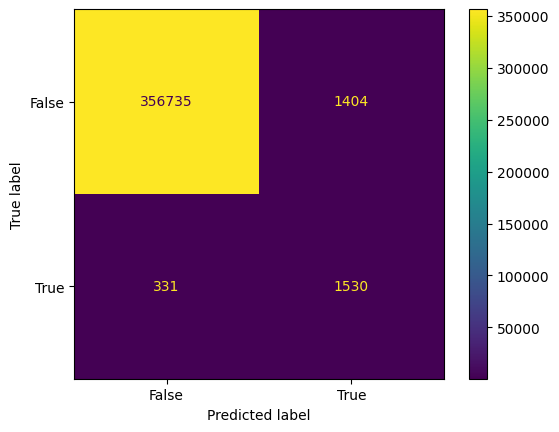

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130214_183538_unetimg.jpg'
Failed to process image 4.


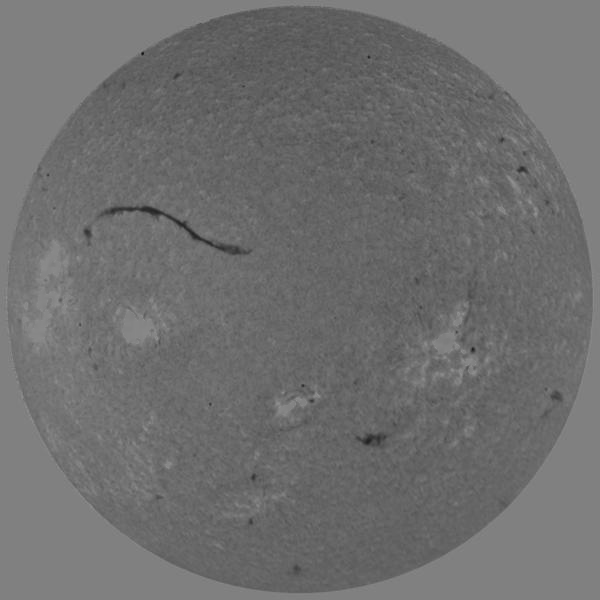

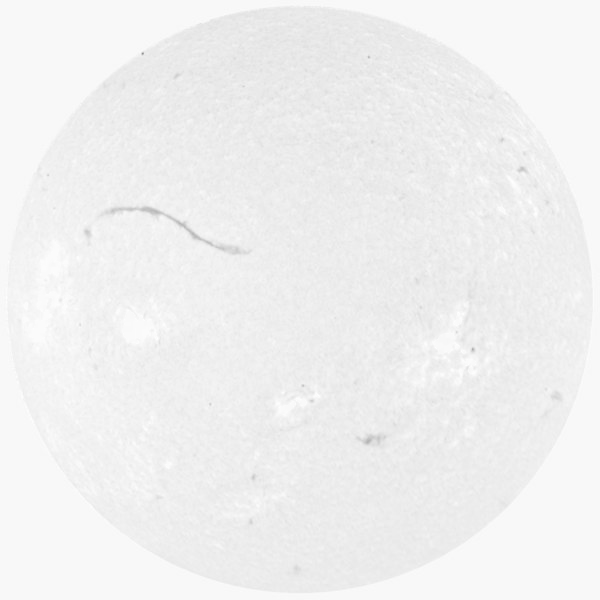

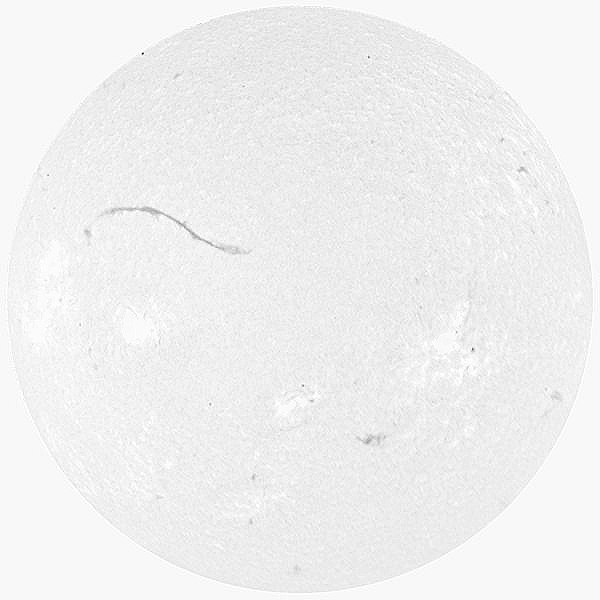

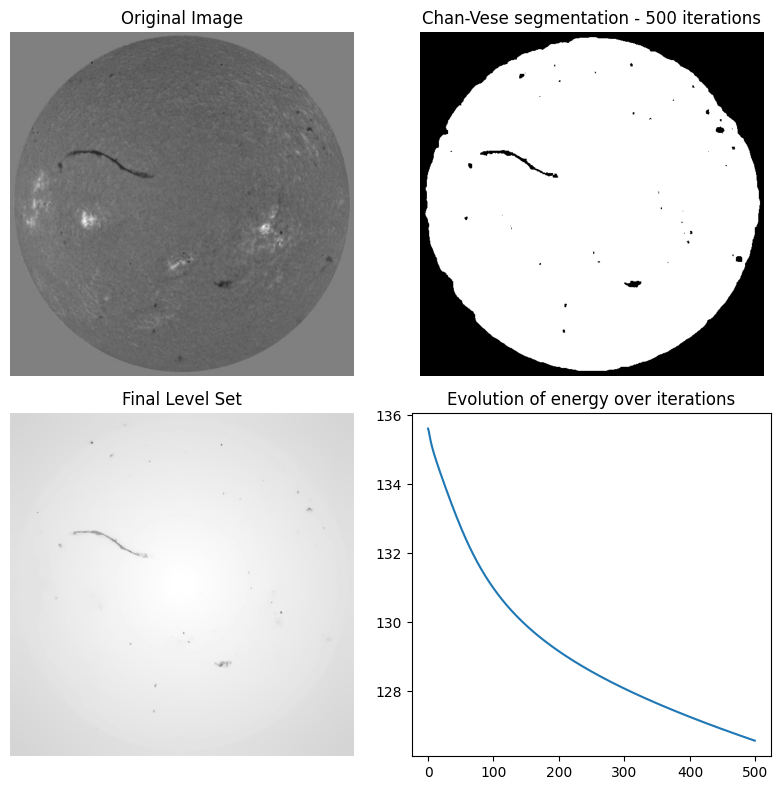

(600, 600)
42
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
43
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


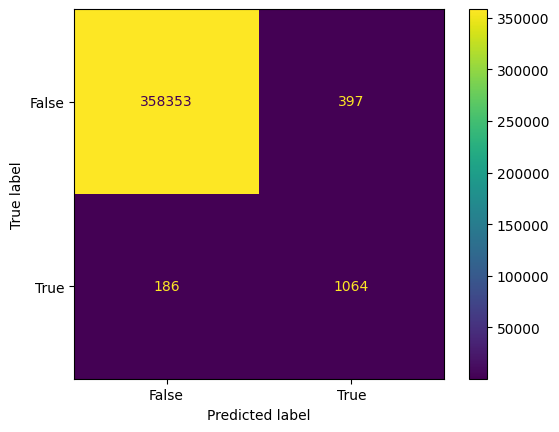

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130218_204935_unetimg.jpg'
Failed to process image 5.


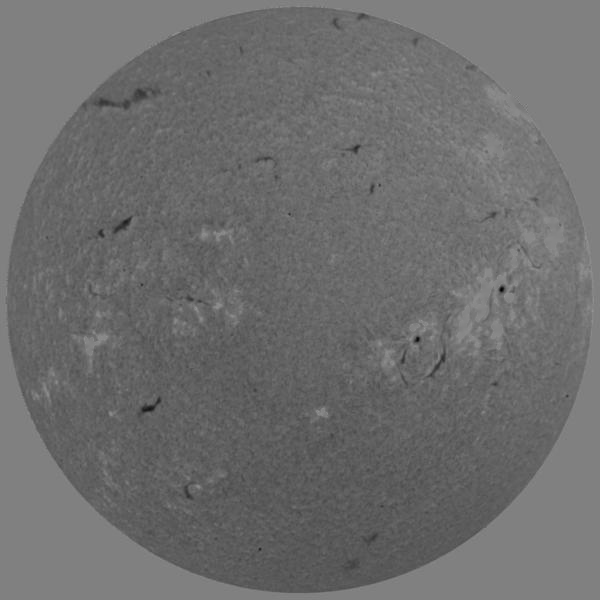

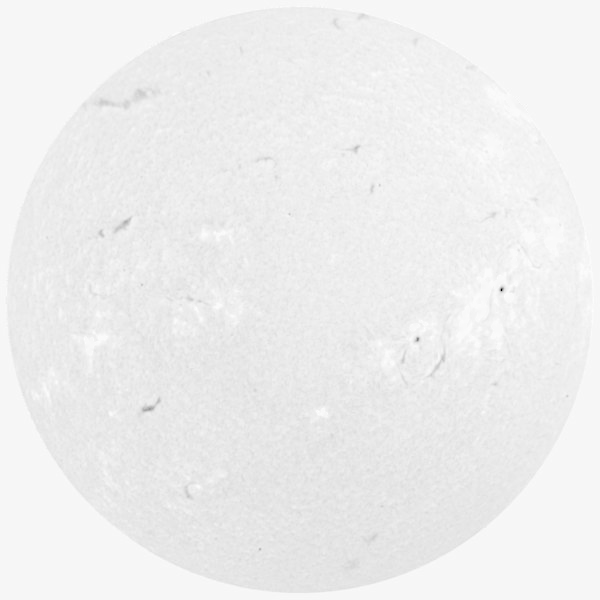

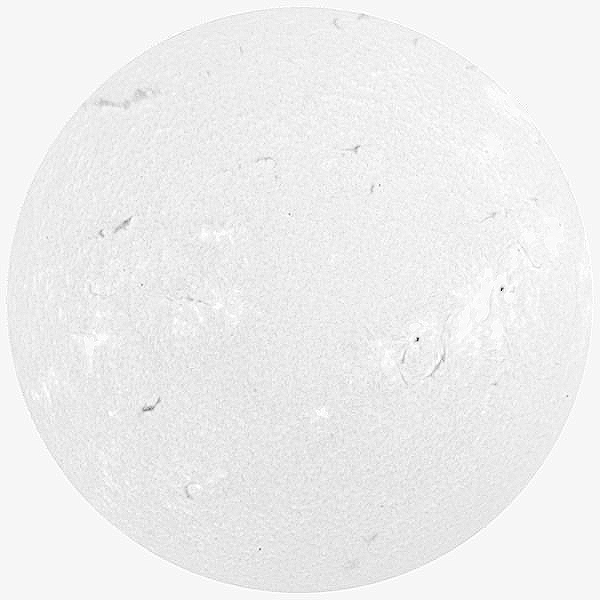

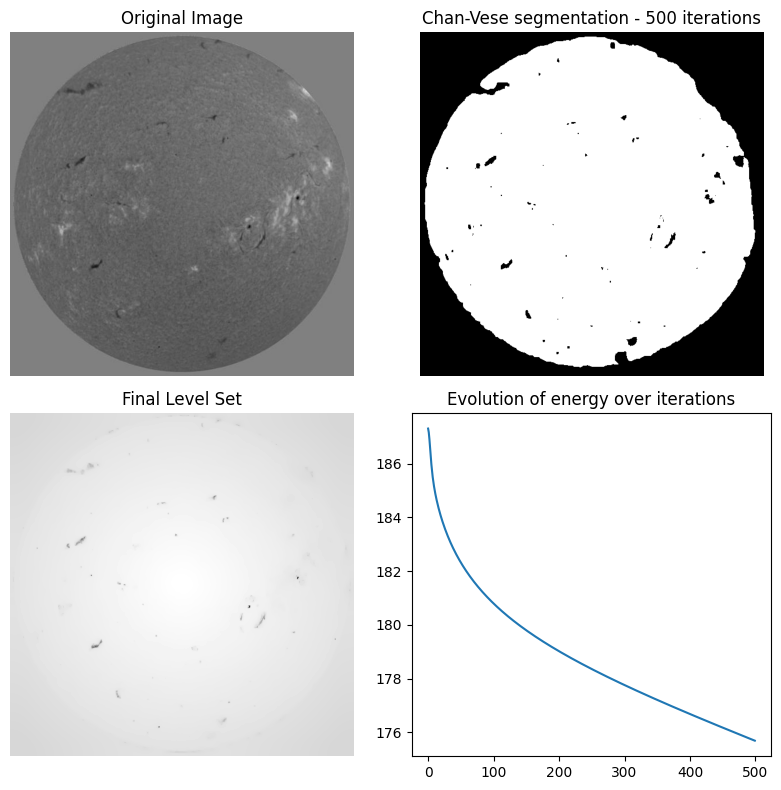

(600, 600)
64
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
65
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


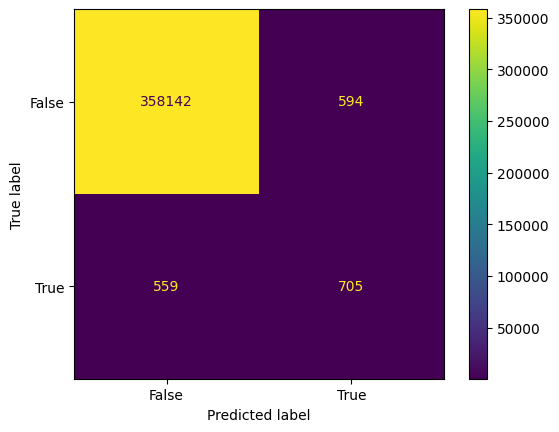

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130318_191817_unetimg.jpg'
Failed to process image 6.


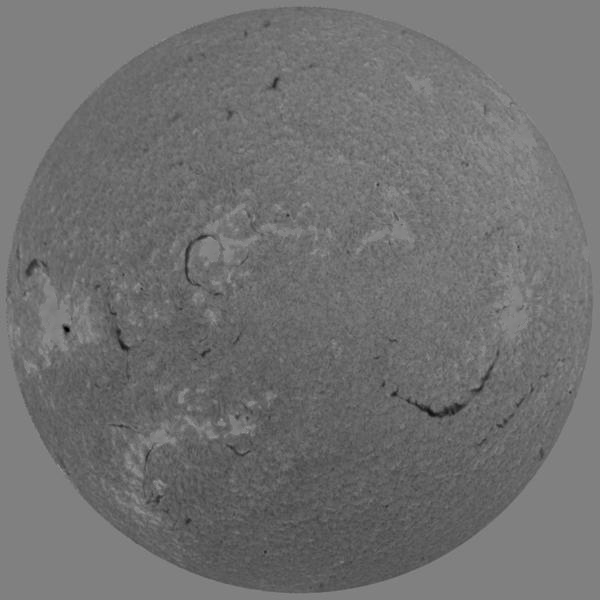

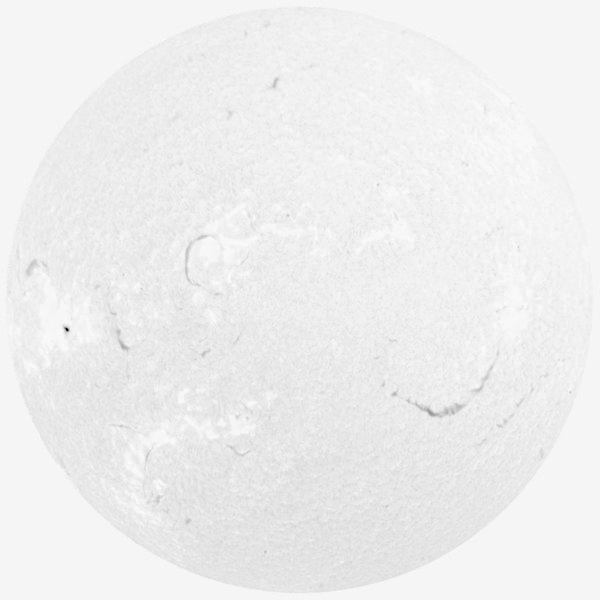

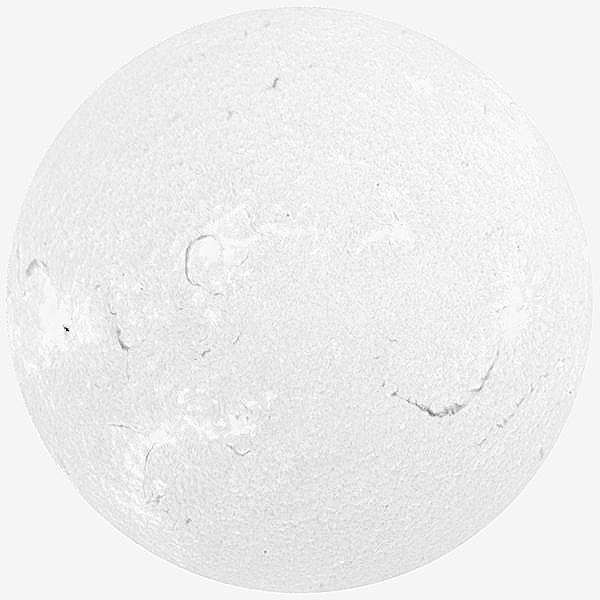

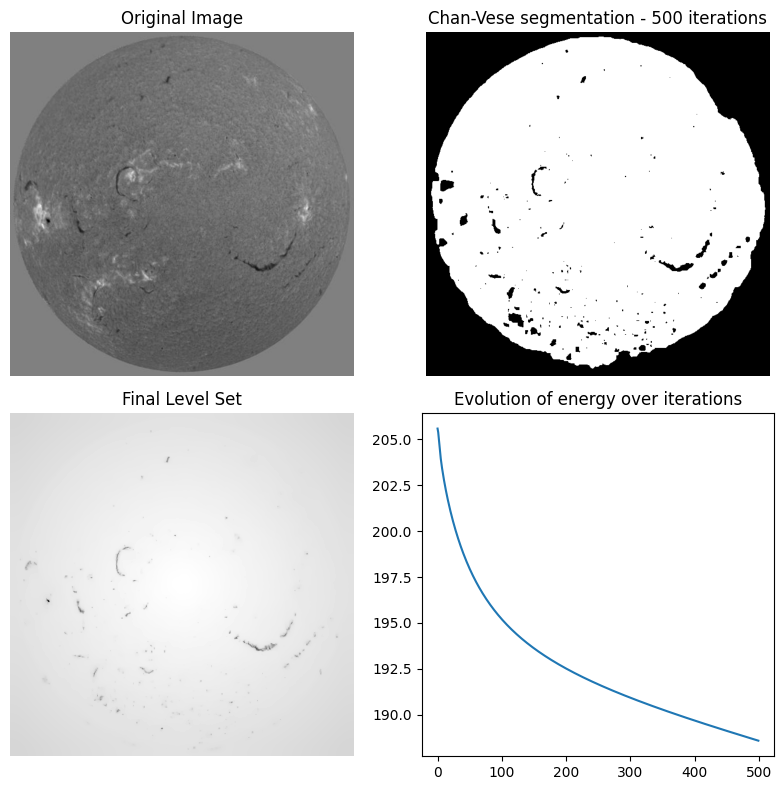

(600, 600)
193
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
194
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


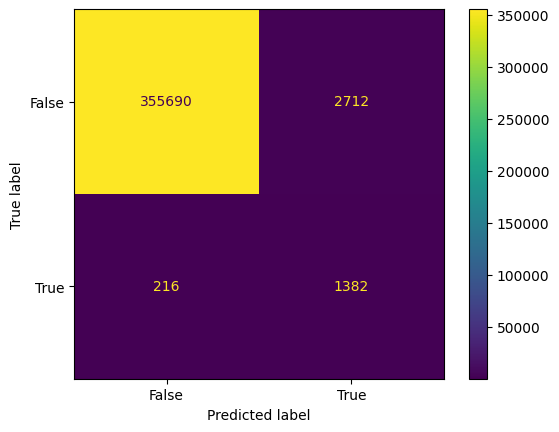

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130401_183453_unetimg.jpg'
Failed to process image 7.


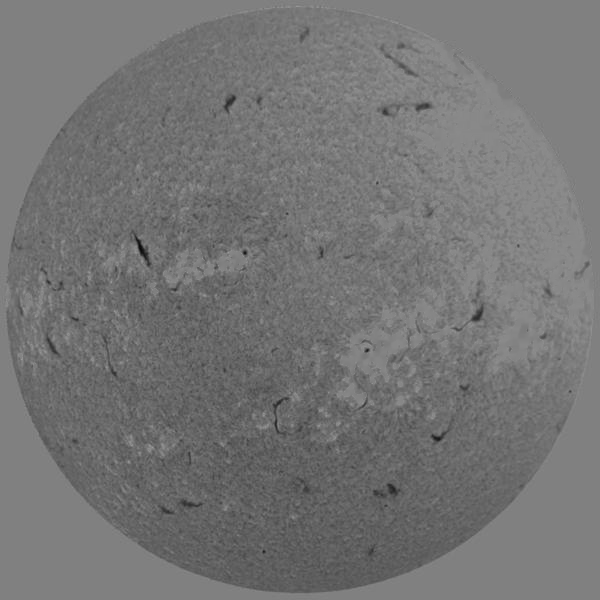

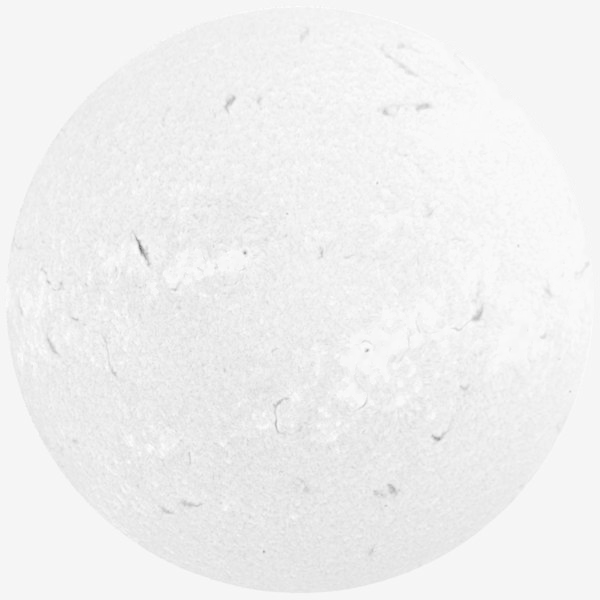

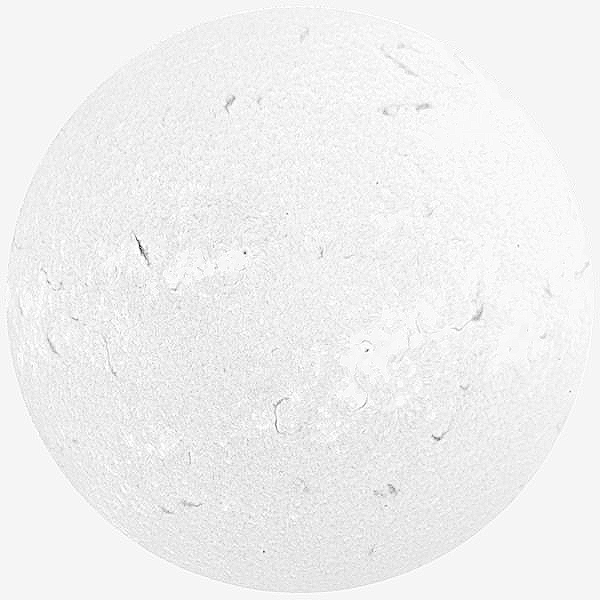

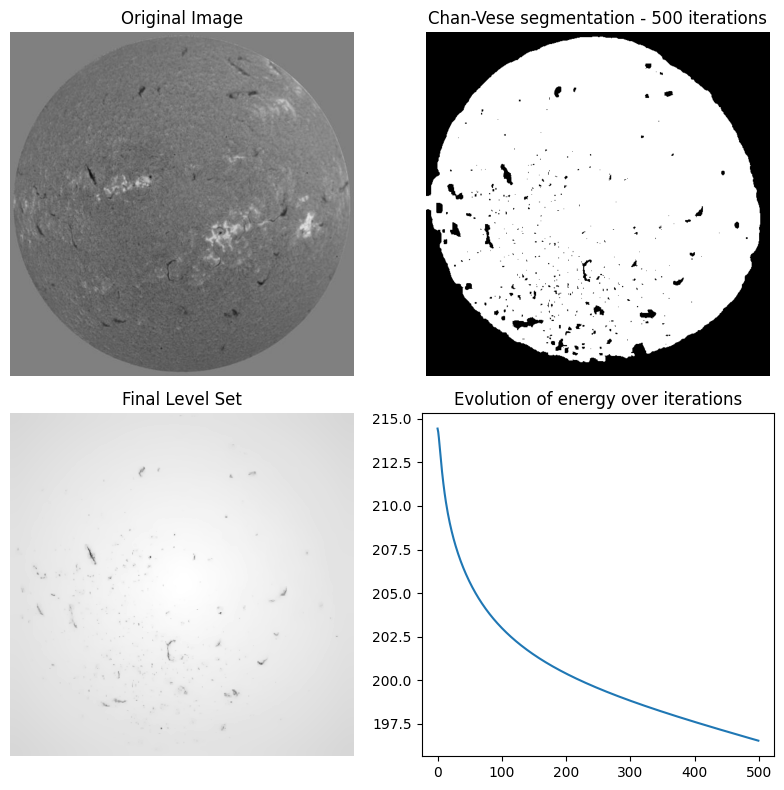

(600, 600)
348
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
349
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


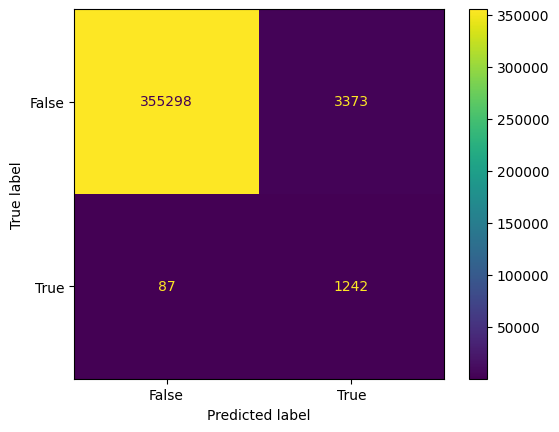

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130412_183554_unetimg.jpg'
Failed to process image 8.


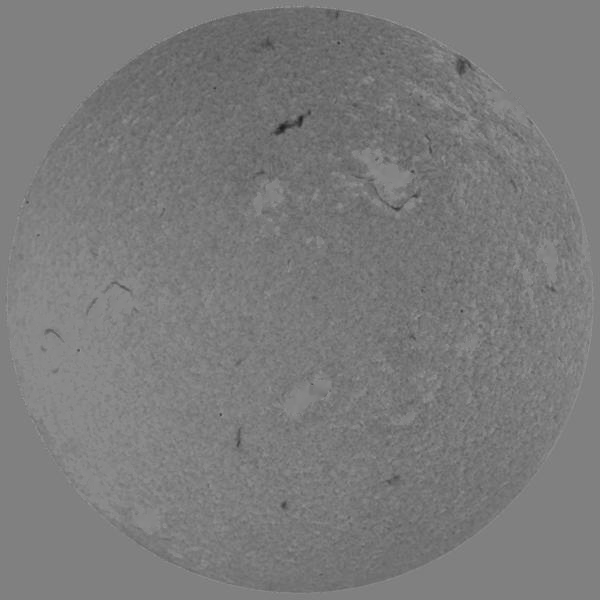

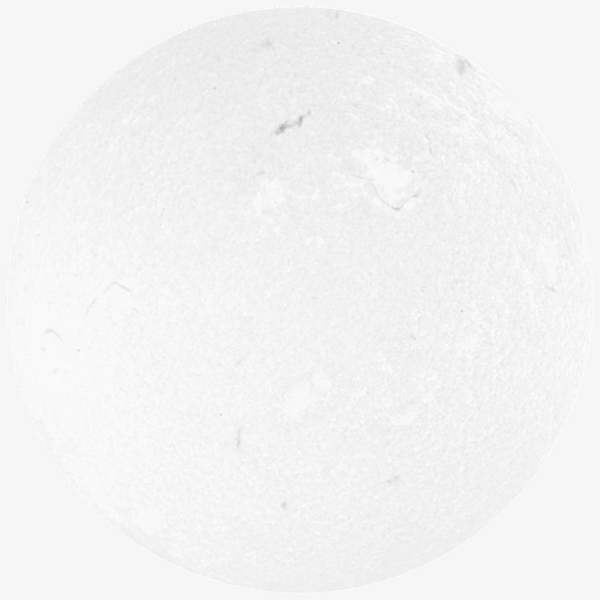

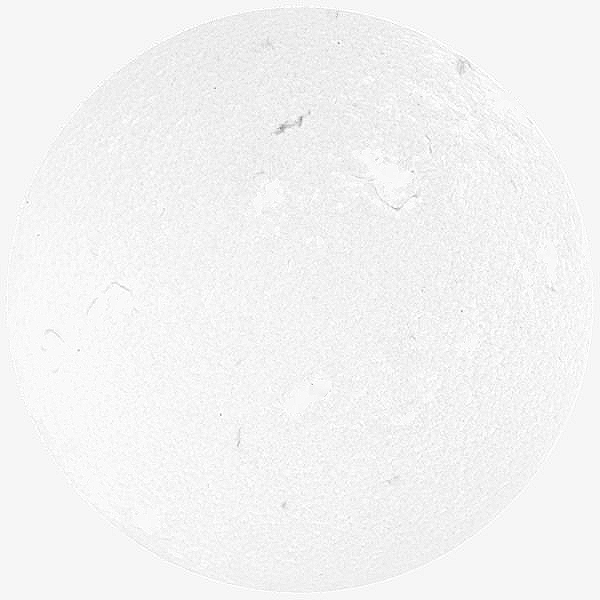

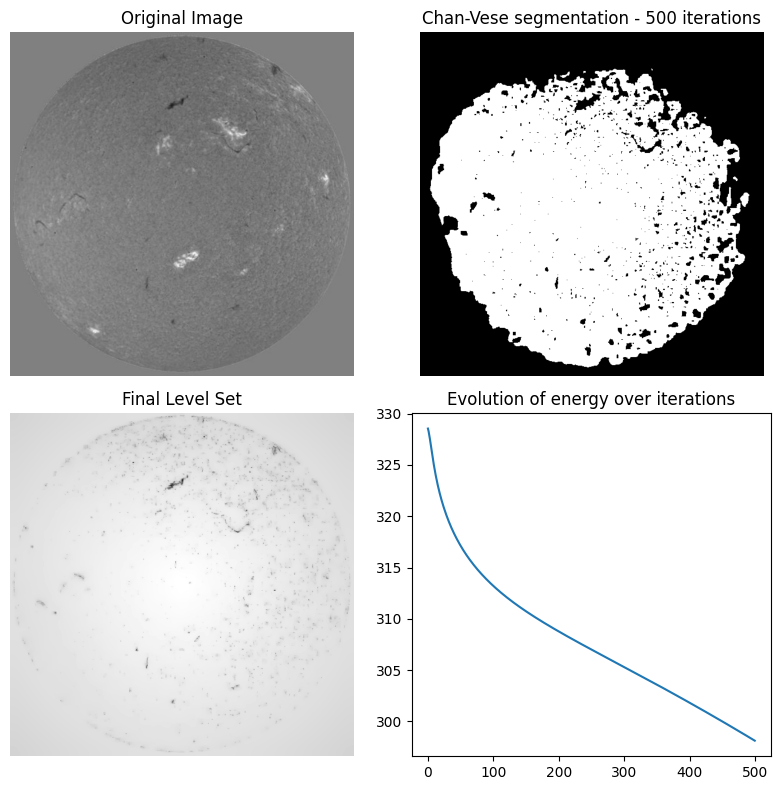

(600, 600)
686
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
687
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


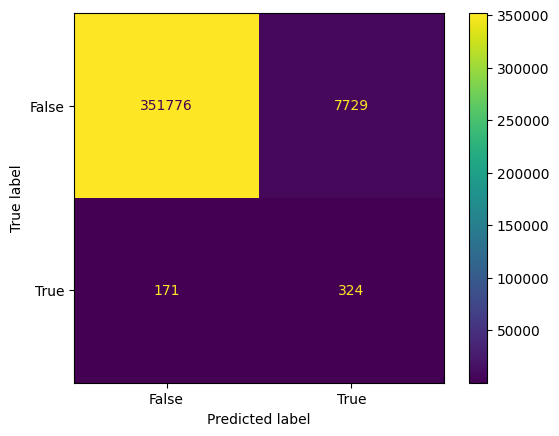

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130419_220329_unetimg.jpg'
Failed to process image 9.


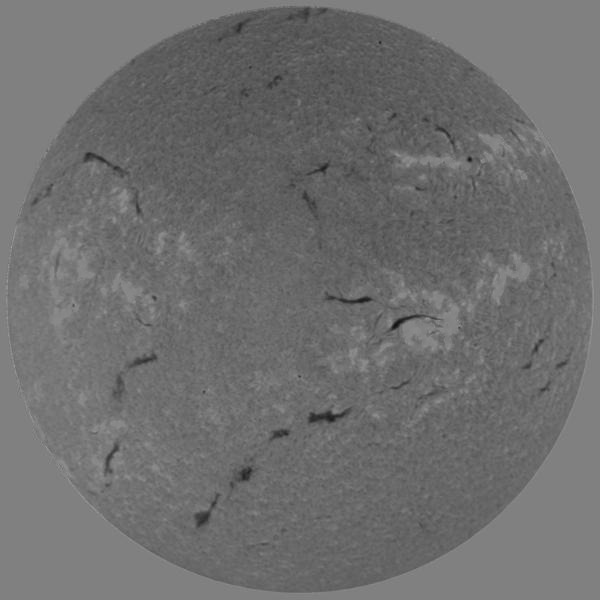

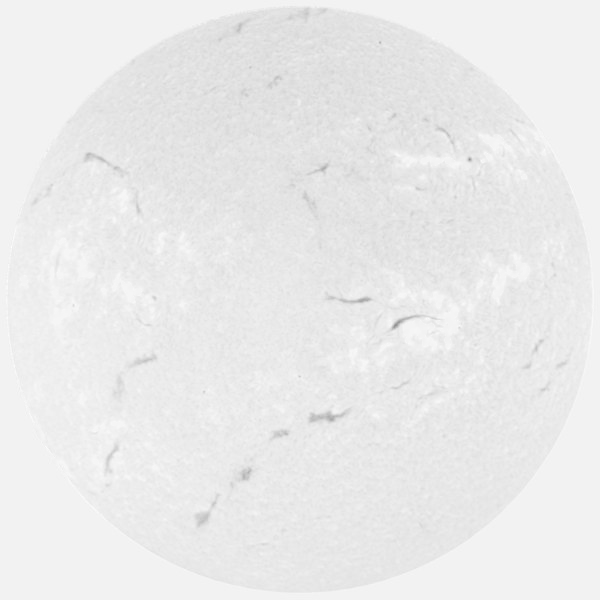

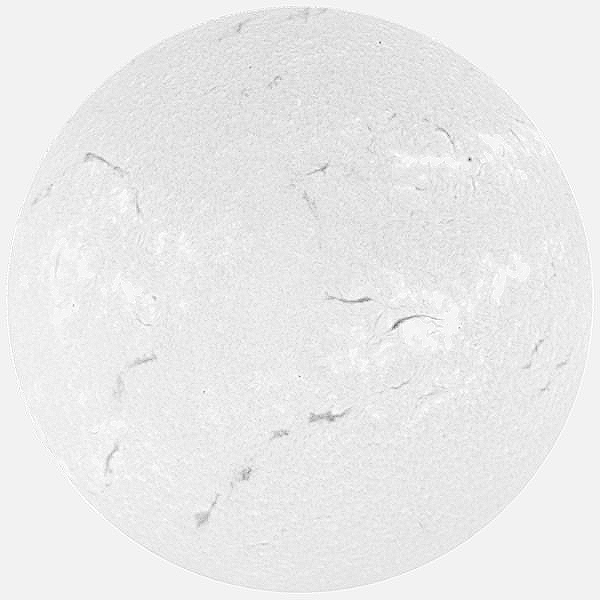

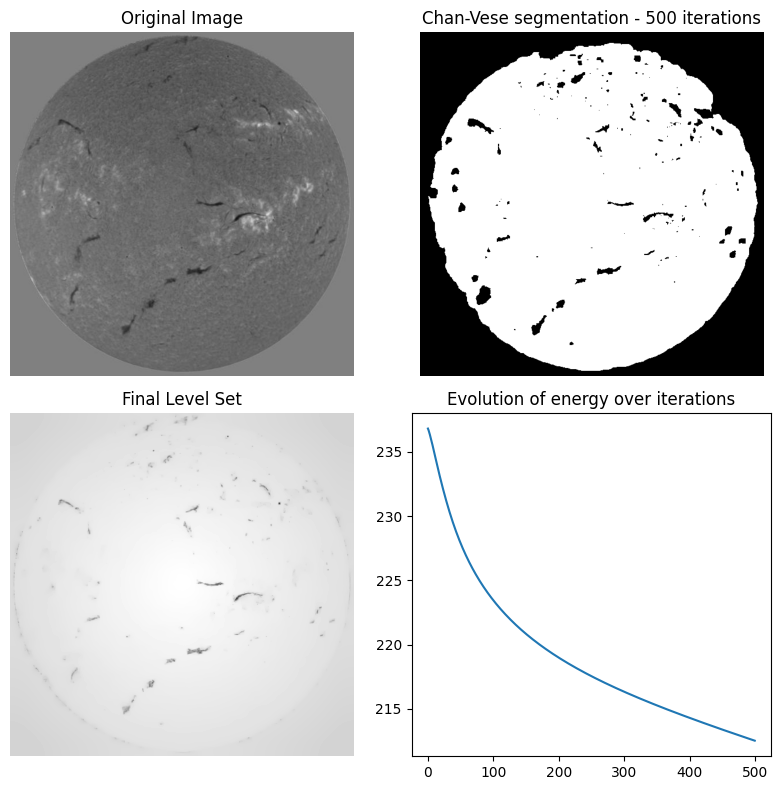

(600, 600)
151
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
152
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


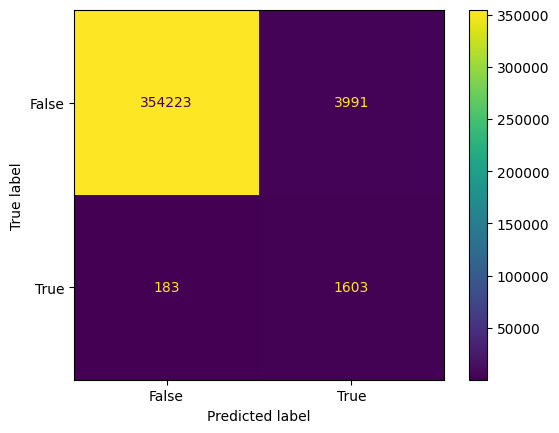

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130528_232444_unetimg.jpg'
Failed to process image 10.


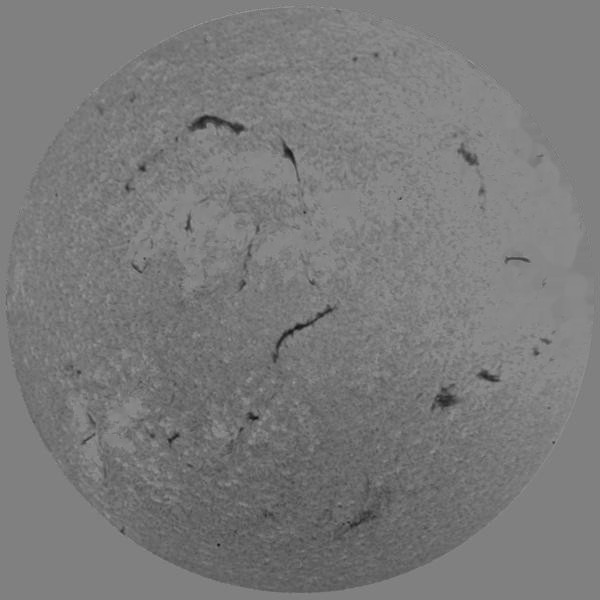

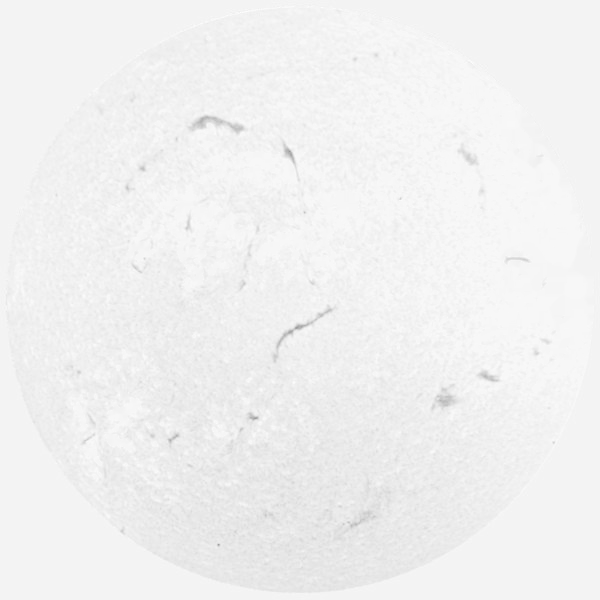

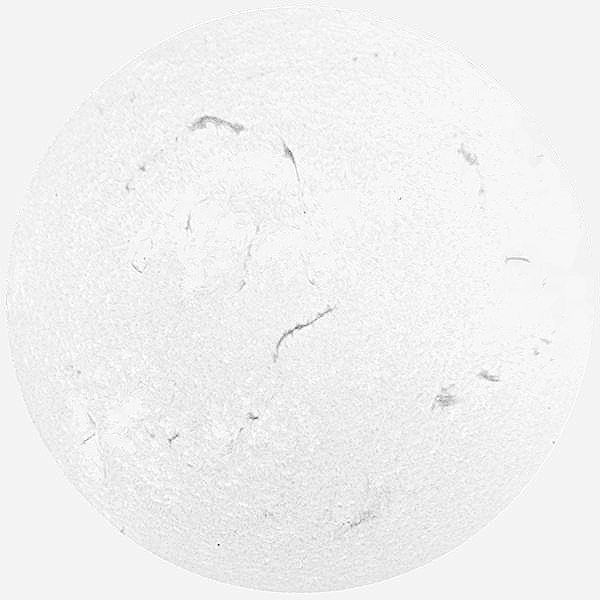

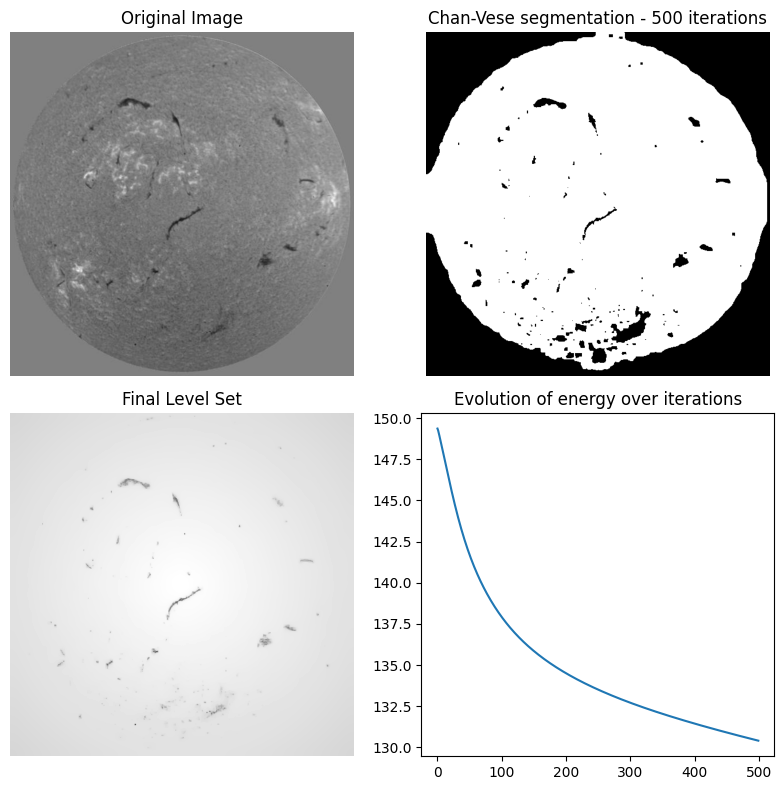

(600, 600)
129
[[1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
130
[[1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
uint8


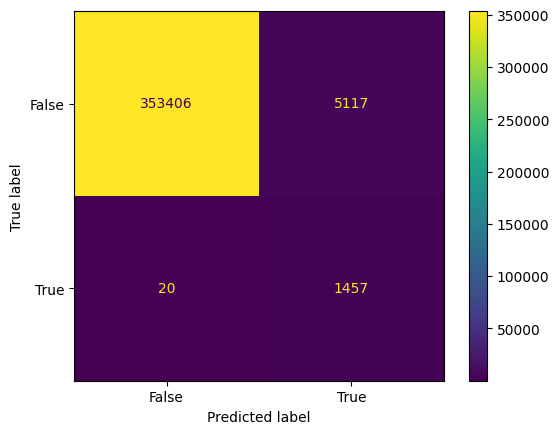

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130531_151102_unetimg.jpg'
Failed to process image 11.


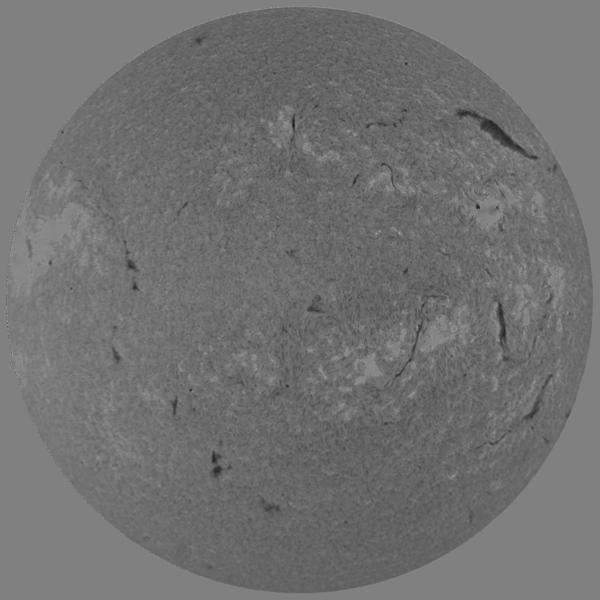

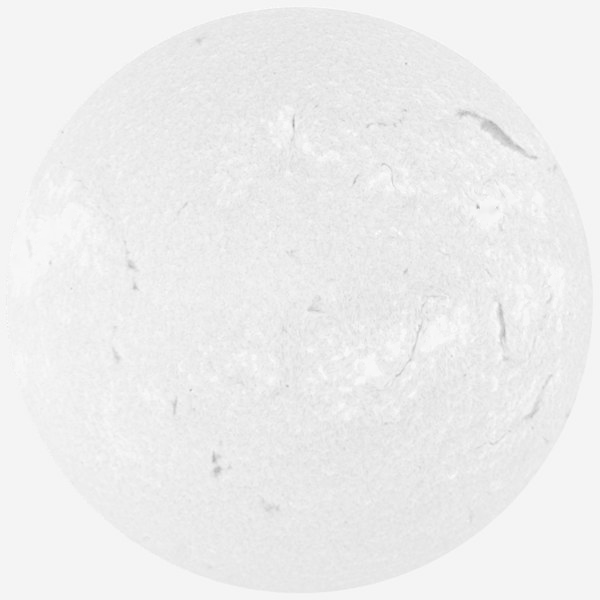

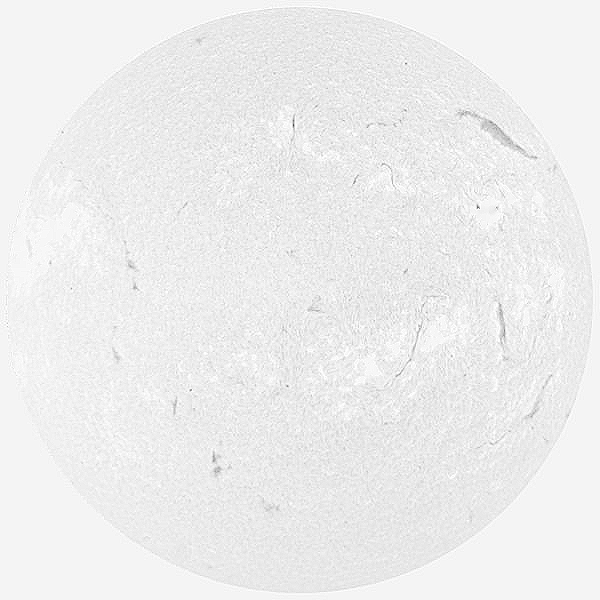

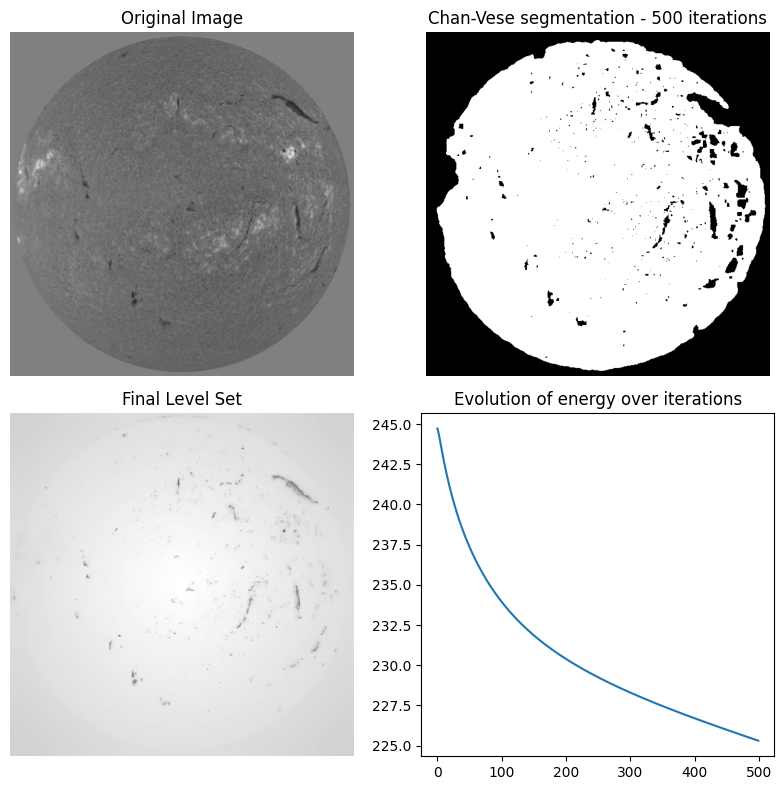

(600, 600)
373
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
374
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


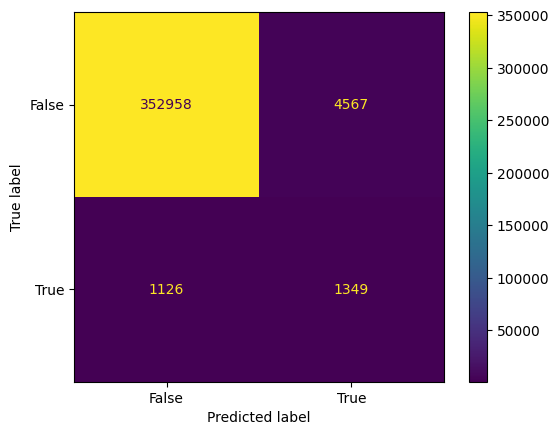

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130614_212450_unetimg.jpg'
Failed to process image 12.


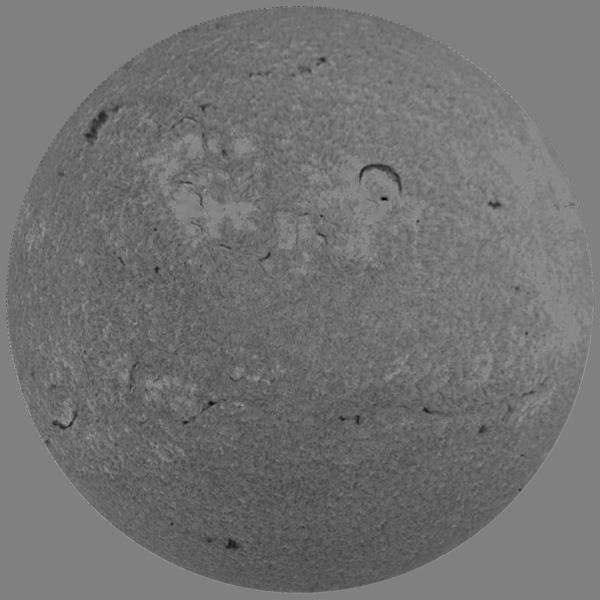

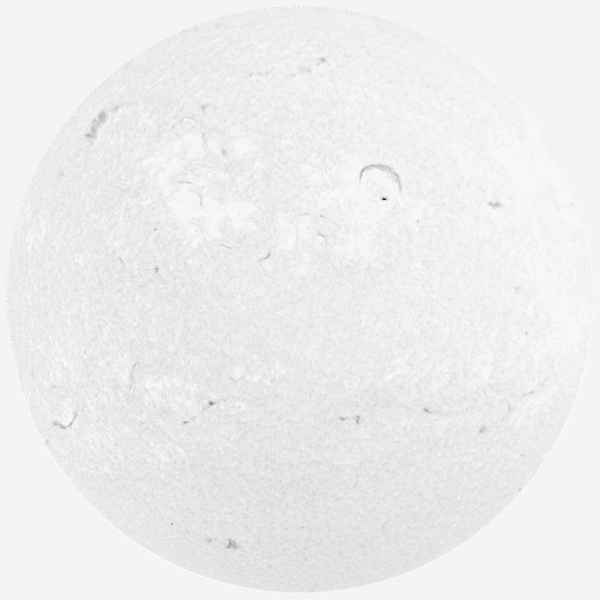

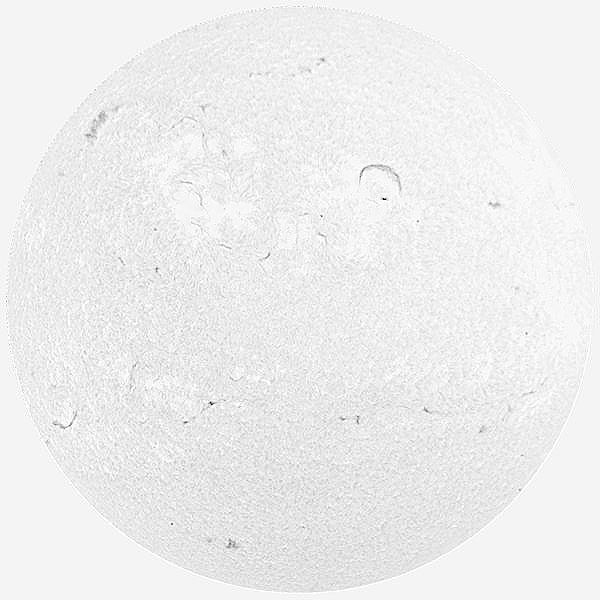

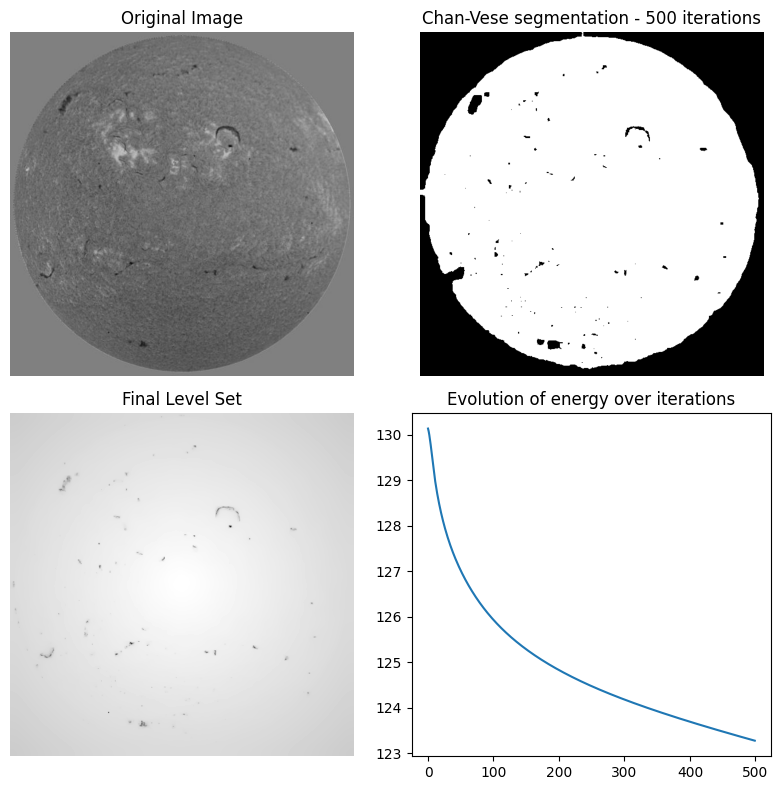

(600, 600)
103
[[1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
104
[[1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
uint8


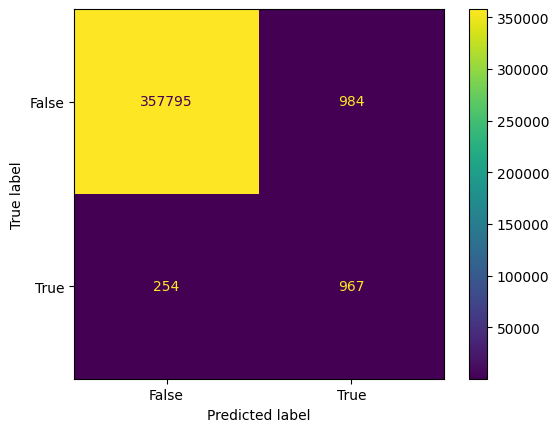

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130627_152035_unetimg.jpg'
Failed to process image 13.


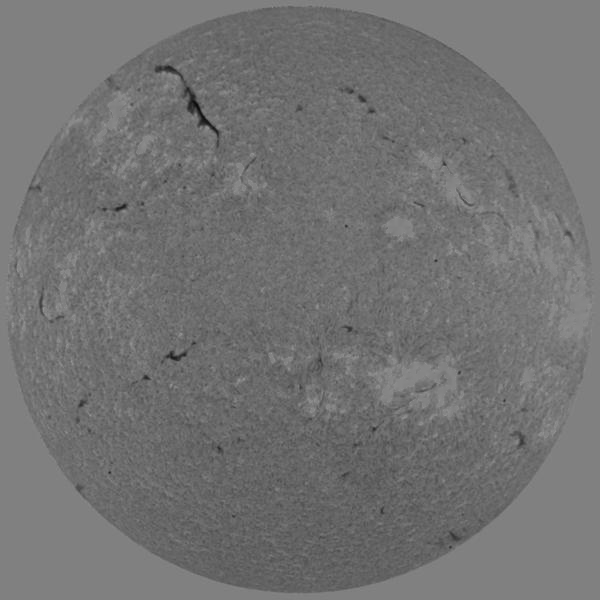

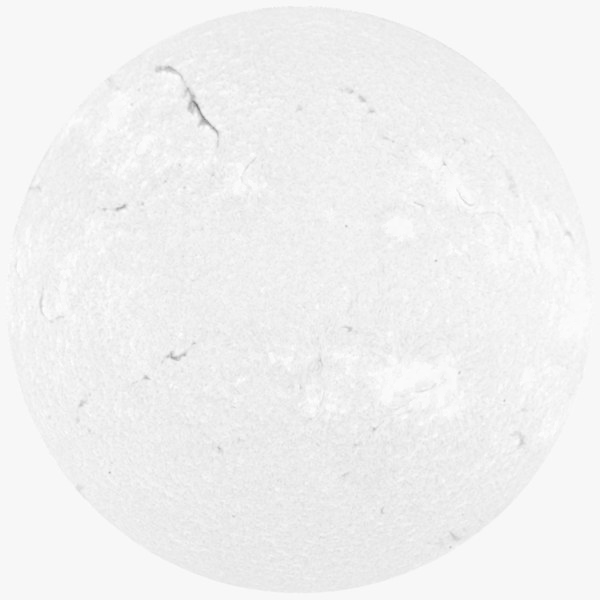

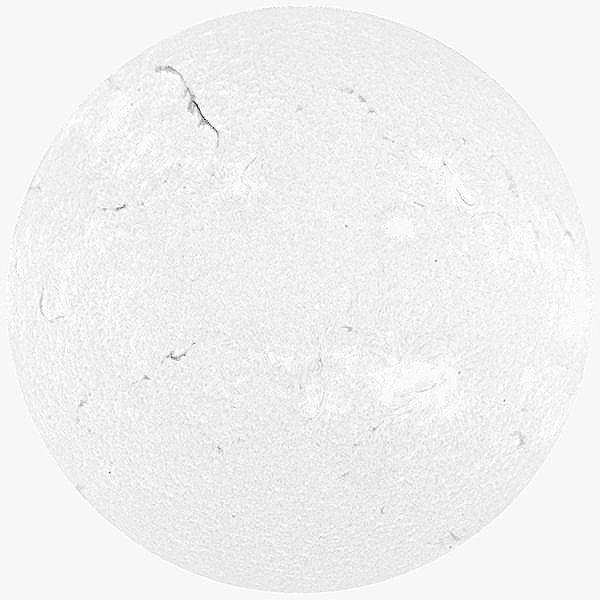

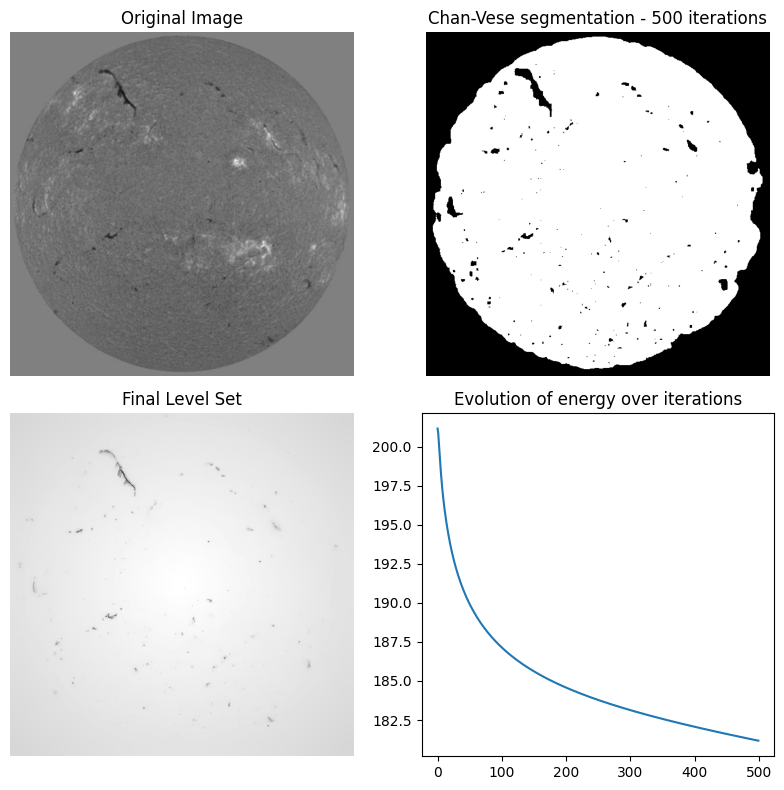

(600, 600)
199
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
200
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


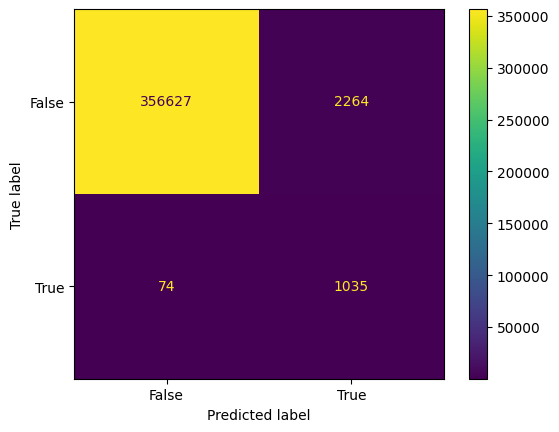

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130808_162904_unetimg.jpg'
Failed to process image 14.


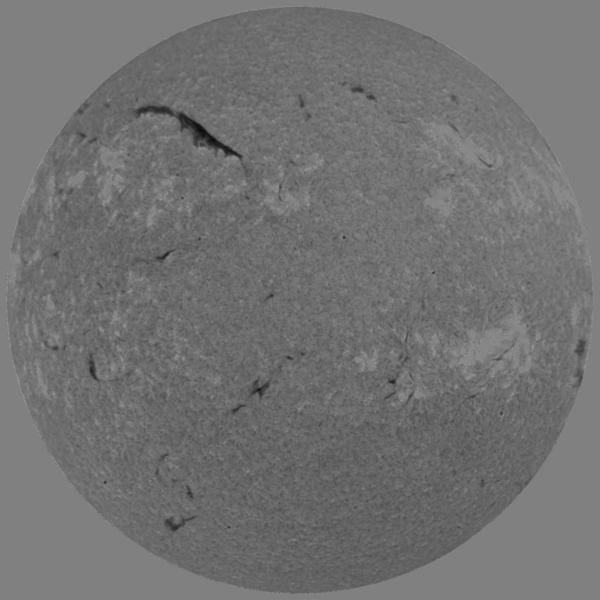

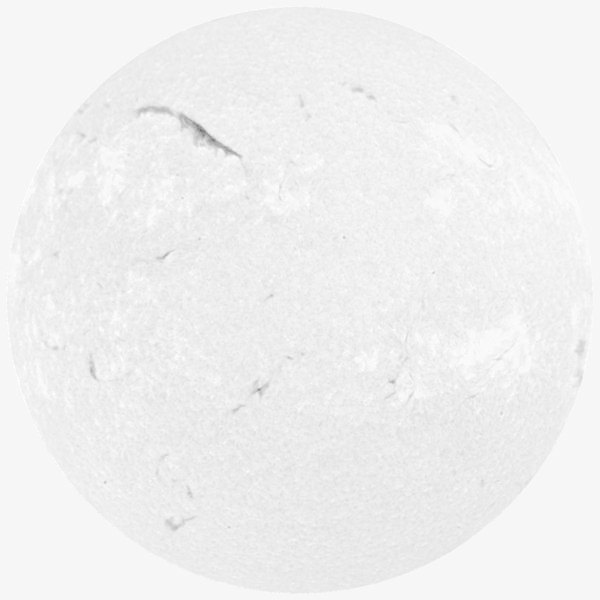

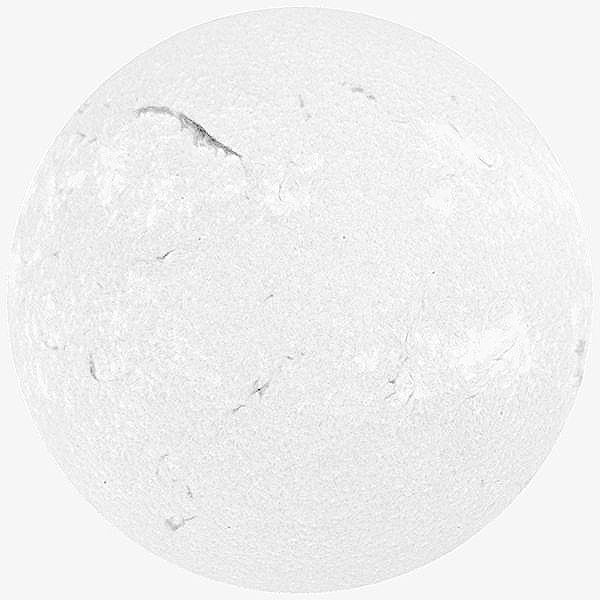

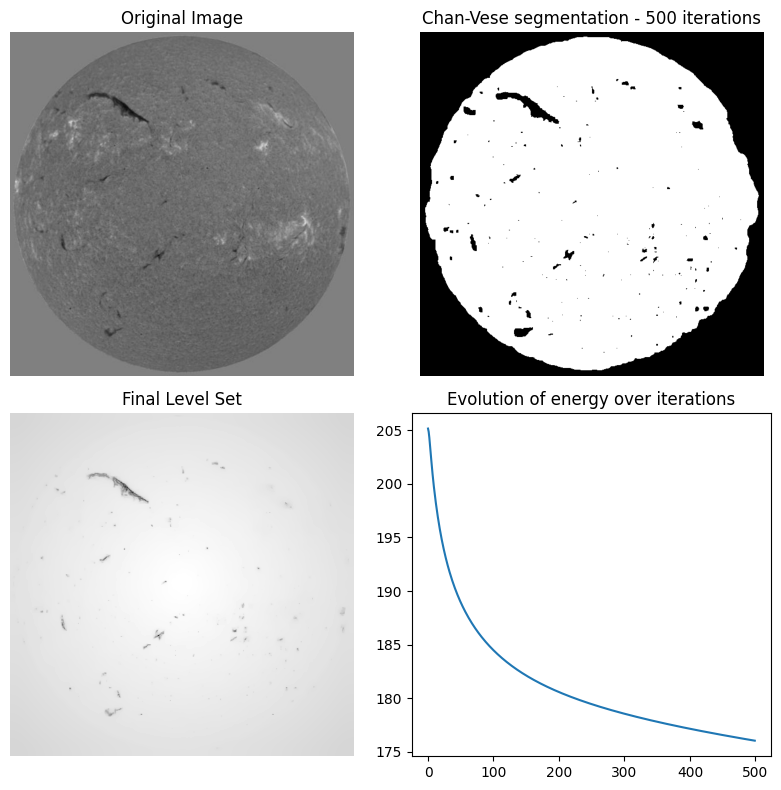

(600, 600)
171
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
172
[[1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 ...
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]
 [1 1 1 ... 1 1 1]]
uint8


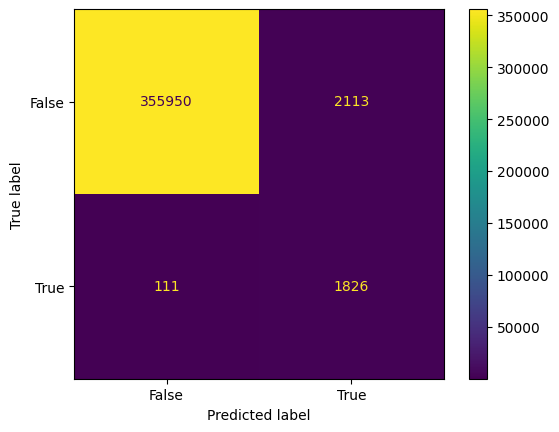

Failed to process image: /content/drive/MyDrive/Bulk_Filament_Detection/train/image/. Error: [Errno 2] No such file or directory: '/content/drive/MyDrive/Bulk_Filament_Detection/Comparison/Results/CV_ACM/Confusion_Matrix/bbso_halph_fi_20130809_180947_unetimg.jpg'
Failed to process image 15.


In [ ]:
main()